Projeto realizado por Luiz Fernando da Costa Castro (luizfernandoccastro@gmail.com)

# Projeto BI NLP

## Importação da base e tratamentos iniciais

### Objetivo do trabalho

Proposta do trabalho postada pelo professor:

"Trabalho BI

1- A base do trabalho são todas as reclamações fundamentadas que foram audiência no
ano de 2017.

2- Por favor crie uma wordcloud para empresa e para estado e outra para serviço com
intuito de saber qual é a empresa com mais reclamações.
Códigos de referência da aula 1 e 2"

### Instalação e importação de bibliotecas

In [1]:
%pip install nltk
%pip install scikit-image
%pip install matplotlib
%pip install pandas
%pip install wordcloud
%pip install seaborn
%pip install unidecode
%matplotlib inline

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [2]:
import nltk
import pandas as pd
import os
import numpy as np
import string
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
#os.chdir(r"C:\Users\054181631\Desktop\Pessoal\Pós")

### Importação da base

In [4]:
df = pd.read_csv('base reclamações.csv',encoding='windows-1252',sep =';')
# verificação visual das 5 primeiras linhas
df.head()

,Regiao,estado,empresa,subsidiaria,area,serviço,problema,faixa etarea
0,Sudeste,SP,ITAÚ UNIBANCO S/A,BANCO ITAÚ/BANCO UNIBANCO,"BANCOS MÚLTIPLOS, COM CARTEIRA COMERCIAL",Outros Contratos,"Contrato (não cumprimento, alteração, transfer...",entre 31 a 40 anos
1,Sudeste,SP,CLARO S/A,NET,NaN,Telefonia Fixa ( Plano de Expansão / Compra e ...,Contrato - Rescisão/alteração unilateral,mais de 70 anos
2,Sudeste,SP,ELETROPAULO METROPOLITANA ELETRICIDADE DE S PAULO,ELETROPAULO METROPOLITANA,DISTRIBUIÇÃO DE ENERGIA ELÉTRICA,Energia Elétrica,PID - Pedido de Indenização por Danos Morais,entre 31 a 40 anos
3,Sudeste,SP,GNN GARAGENS LTDA - EPP,NETPARK.COM.BR,ESTACIONAMENTO DE VEÍCULOS,"Estacionamento ( Particular, Supermercado, Sho...","Vicio de qualidade (mal executado, inadequado,...",entre 31 a 40 anos
4,Sudeste,SP,CLARO S/A,CLARO / NET / EMBRATEL / CLAROTV,TELEFONIA MÓVEL CELULAR,Telefonia Fixa ( Plano de Expansão / Compra e ...,"Vicio de qualidade (mal executado, inadequado,...",entre 41 a 50 anos


### Tratamento da base

nessa parte iremos mostrar informações sobre a base e fazer tratamentos para utilizá-la de forma mais eficiente e intuitiva

In [5]:
df.columns

Index(['Regiao ', 'estado', 'empresa', 'subsidiaria  ', 'area ', 'serviço',
       'problema', 'faixa etarea'],
      dtype='object')

In [6]:
df['Regiao '].value_counts()

Regiao 
Centro-oeste    16459
Sudeste         12415
Nordeste         8423
Norte            2965
Sul              2045
Name: count, dtype: int64

In [7]:
df.rename(columns={'Regiao ': 'regiao', 'subsidiaria  ':'subsidiaria', 'area ':'area'}, inplace=True)
#as colunas estão com os nomes esquisitos. Alguns estão maiúsculos, outros tem espaços em branco após o nome, por isso é necessário padronizar

In [8]:
df.head()
#pegando os 5 primeiros valores após a mudança do nome das colunas

,regiao,estado,empresa,subsidiaria,area,serviço,problema,faixa etarea
0,Sudeste,SP,ITAÚ UNIBANCO S/A,BANCO ITAÚ/BANCO UNIBANCO,"BANCOS MÚLTIPLOS, COM CARTEIRA COMERCIAL",Outros Contratos,"Contrato (não cumprimento, alteração, transfer...",entre 31 a 40 anos
1,Sudeste,SP,CLARO S/A,NET,NaN,Telefonia Fixa ( Plano de Expansão / Compra e ...,Contrato - Rescisão/alteração unilateral,mais de 70 anos
2,Sudeste,SP,ELETROPAULO METROPOLITANA ELETRICIDADE DE S PAULO,ELETROPAULO METROPOLITANA,DISTRIBUIÇÃO DE ENERGIA ELÉTRICA,Energia Elétrica,PID - Pedido de Indenização por Danos Morais,entre 31 a 40 anos
3,Sudeste,SP,GNN GARAGENS LTDA - EPP,NETPARK.COM.BR,ESTACIONAMENTO DE VEÍCULOS,"Estacionamento ( Particular, Supermercado, Sho...","Vicio de qualidade (mal executado, inadequado,...",entre 31 a 40 anos
4,Sudeste,SP,CLARO S/A,CLARO / NET / EMBRATEL / CLAROTV,TELEFONIA MÓVEL CELULAR,Telefonia Fixa ( Plano de Expansão / Compra e ...,"Vicio de qualidade (mal executado, inadequado,...",entre 41 a 50 anos


In [9]:
df.columns
#colunas com nomes padronizados

Index(['regiao', 'estado', 'empresa', 'subsidiaria', 'area', 'serviço',
       'problema', 'faixa etarea'],
      dtype='object')

In [10]:
df.shape
#formato do dataframe

(42307, 8)

In [11]:
df.isna().sum()
#presença de muitos nulls em subsidiária, área e descrição do problema

regiao             0
estado             0
empresa            1
subsidiaria     6530
area            5329
serviço            0
problema        8936
faixa etarea       0
dtype: int64

## Empresas

### Criação e tratamento do dataframe de empresas

vamos criar um dataframe apenas com os nomes das empresas e depois verificar se há algum campo não preenchido e analisar se deve ser mantido, tratado ou descartado

In [12]:
df_empresa = df[['empresa']]
df_empresa.head()

,empresa
0,ITAÚ UNIBANCO S/A
1,CLARO S/A
2,ELETROPAULO METROPOLITANA ELETRICIDADE DE S PAULO
3,GNN GARAGENS LTDA - EPP
4,CLARO S/A


In [13]:
df_empresa.isna().sum()

empresa    1
dtype: int64

In [14]:
df_empresa[df_empresa.isna().any(axis=1)]

,empresa
966,NaN


In [15]:
df_empresa.iloc[966]

empresa    NaN
Name: 966, dtype: object

não há informações suficientes para sabermos qual é a empresa. Temos apenas as informações de serviço, região e estado, portanto é melhor descartar essa informação

In [16]:
df_empresa.dropna(inplace=True)
df_empresa.isna().sum()

C:\Users\054181631\AppData\Local\Temp\ipykernel_38736\3022190064.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_empresa.dropna(inplace=True)


empresa    0
dtype: int64

Substituição de caracteres especiais e espaços
" " por "_" (espaço)
"/" por ""
"," por ""
"(" por ""
")" por ""
"-" por ""
"." por ""
"\t" por "" (tab)

In [17]:
dicionario = {' ':'_','/':'',',':'','\(':'','\)':'',"-":'','\.':'',r"^\t":''}
df_empresa["empresa com tratamento"] = df_empresa.replace({'empresa': dicionario},regex=True)
# Substituição de caracteres especiais e espaços " " por "_" (espaço) "/" por "" "," por "" "(" por "" ")" por "" "-" por "" "." por "" "\" por "" (tab)

<>:1: SyntaxWarning: invalid escape sequence '\('
<>:1: SyntaxWarning: invalid escape sequence '\)'
<>:1: SyntaxWarning: invalid escape sequence '\.'
<>:1: SyntaxWarning: invalid escape sequence '\('
<>:1: SyntaxWarning: invalid escape sequence '\)'
<>:1: SyntaxWarning: invalid escape sequence '\.'
C:\Users\054181631\AppData\Local\Temp\ipykernel_38736\1010392792.py:1: SyntaxWarning: invalid escape sequence '\('
  dicionario = {' ':'_','/':'',',':'','\(':'','\)':'',"-":'','\.':'',r"^\t":''}
C:\Users\054181631\AppData\Local\Temp\ipykernel_38736\1010392792.py:1: SyntaxWarning: invalid escape sequence '\)'
  dicionario = {' ':'_','/':'',',':'','\(':'','\)':'',"-":'','\.':'',r"^\t":''}
C:\Users\054181631\AppData\Local\Temp\ipykernel_38736\1010392792.py:1: SyntaxWarning: invalid escape sequence '\.'
  dicionario = {' ':'_','/':'',',':'','\(':'','\)':'',"-":'','\.':'',r"^\t":''}


C:\Users\054181631\AppData\Local\Temp\ipykernel_38736\1010392792.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_empresa["empresa com tratamento"] = df_empresa.replace({'empresa': dicionario},regex=True)


In [18]:
df_empresa["empresa com tratamento"] = df_empresa["empresa com tratamento"].str.lower()
#torna tudo minúsculo

C:\Users\054181631\AppData\Local\Temp\ipykernel_38736\1678942097.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_empresa["empresa com tratamento"] = df_empresa["empresa com tratamento"].str.lower()


In [19]:
dicionario2 = {'banco_santander':'santander', '_ltda':'', '_epp':''}
df_empresa.replace({'empresa com tratamento': dicionario2},regex=True, inplace=True)
#não foi possível substituir _sa por '' que nem o ltda, pois existe banco santander e ao fazer isso o resultado se torna bancotander. Assim, primeiro foi preciso transformar banco_santander em santander e depois realizar a mudança de _sa para ''

C:\Users\054181631\AppData\Local\Temp\ipykernel_38736\1320964754.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_empresa.replace({'empresa com tratamento': dicionario2},regex=True, inplace=True)


In [20]:
dicionario3 = {'_sa':''}
df_empresa.replace({'empresa com tratamento': dicionario3},regex=True, inplace=True)
#agora realizando a alteração de todas as empresas terminadas em sa por nada

C:\Users\054181631\AppData\Local\Temp\ipykernel_38736\3554950215.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_empresa.replace({'empresa com tratamento': dicionario3},regex=True, inplace=True)


In [21]:
df_empresa

,empresa,empresa com tratamento
0,ITAÚ UNIBANCO S/A,itaú_unibanco
1,CLARO S/A,claro
2,ELETROPAULO METROPOLITANA ELETRICIDADE DE S PAULO,eletropaulo_metropolitana_eletricidade_de_s_paulo
3,GNN GARAGENS LTDA - EPP,gnn_garagens_
4,CLARO S/A,claro
...,...,...
42302,B2W COMPANHIA DIGITAL,b2w_companhia_digital
42303,ADIDAS DO BRASIL LTDA,adidas_do_brasil
42304,RN COMERCIO VAREJISTA S/A,rn_comercio_varejista
42305,DECOLAR.COM LTDA,decolarcom


### Wordcloud

In [76]:
df_empresa.value_counts('empresa com tratamento').sort_values(ascending=False)
#ordenando das empresas com mais reclamações até as com menos reclamações para ver as que deveriam aparecer mais vezes na wordcloud

empresa com tratamento
telefonica_brasil                                    1150
claro                                                1147
tim_celular                                           788
via_varejo                                            536
eletropaulo_metropolitana_eletricidade_de_s_paulo     480
                                                     ... 
todeschininta_rita_a_z_perin_&_cia_me                   1
pegatron_serviços_de_informatica                        1
pegatron_serviços_de_informática                        1
peixe_urbano                                            1
única_brasilia_automoveis_smaff_ford                    1
Name: count, Length: 10360, dtype: int64

In [ ]:
string_empresas = " ".join([text for text in df_empresa["empresa com tratamento"]])
#criação de uma única string com os nomes das empresas

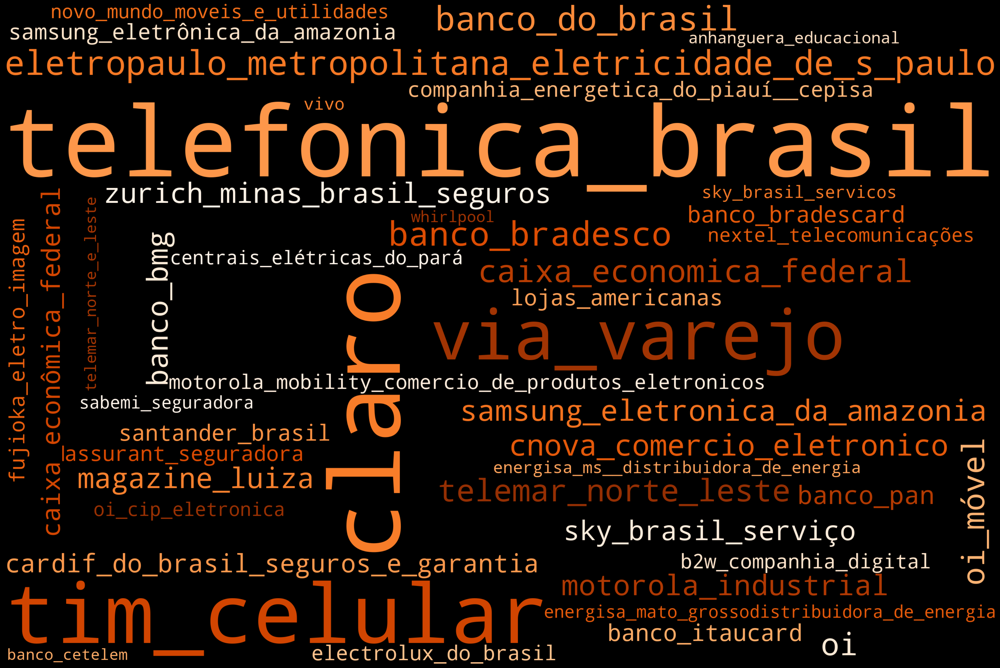

In [24]:
wordcloud_empresas = WordCloud(background_color="black",collocations=False,
                              colormap="Oranges_r",
                              width = 3000,
                              height = 2000,
                              max_font_size=1000,
                              max_words=45
                             ).generate(string_empresas)
plt.figure(figsize = (40,30),
           facecolor = 'k',
           edgecolor = 'k')
plt.imshow(wordcloud_empresas, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

no wordcloud acima foi colocado o limite de 45 empresas, caso contrário seriam mais de 10k resultados de empresas

### Histograma

In [25]:
df_empresa_hist = df_empresa['empresa com tratamento'].value_counts().sort_values(ascending=False).head(45).reset_index()
# para realizar um histograma das empresas, vamos primeiro ordená-las da com mais reclamação para menos e limitar às 45 primeiras que aparecem e resetar o index para refletir a nova mudança. O objetivo é evitar criar um histograma com todas as empresas e deixar um gráfico menos poluído

In [26]:
df_empresa_hist

,empresa com tratamento,count
0,telefonica_brasil,1150
1,claro,1147
2,tim_celular,788
3,via_varejo,536
4,eletropaulo_metropolitana_eletricidade_de_s_paulo,480
5,banco_do_brasil,475
6,banco_bradesco,471
7,caixa_economica_federal,419
8,telemar_norte_leste,407
9,oi,405


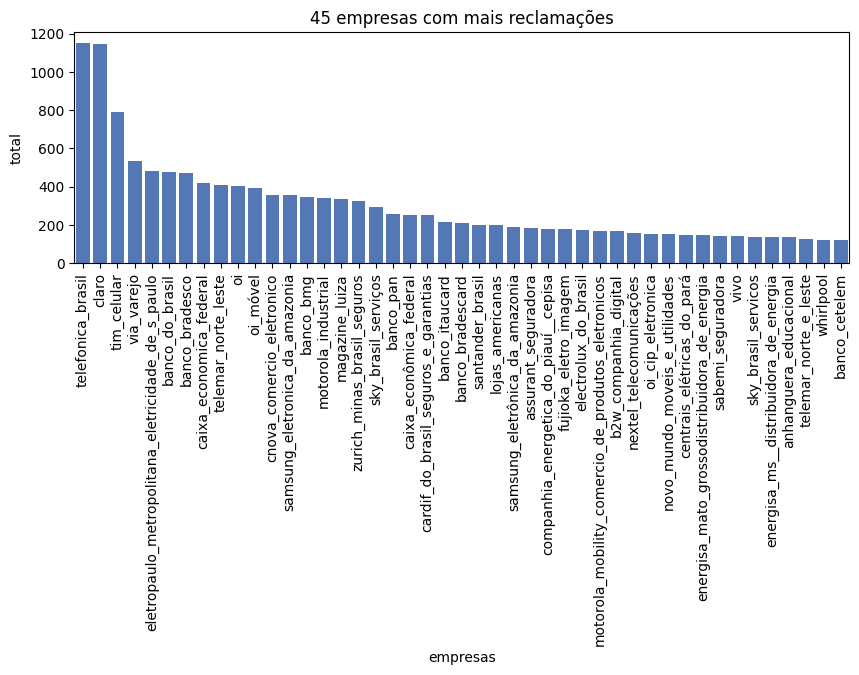

In [27]:
ax = sns.barplot(data=df_empresa_hist, x='empresa com tratamento', y='count', color='#4473C5')
ax.figure.set_size_inches(10,3)
ax.set_title('45 empresas com mais reclamações')
ax.set(xlabel='empresas', ylabel='total')
plt.xticks(rotation=90);

vale observar que algumas dessas empresas poderiam ser juntadas, como telefonica brasil e vivo, claro e sky, banco itaucard e itau unibanco. Para realizar essas mudanças seria necessária uma analise mais profunda

por essa wordcloud concluímos que as empresas de telefonia são as que mais possuem reclamações. Os segmento de telefonia, energia e bancos correspodem pela maioria das empresas com mais reclamações.

## Estados

### Criação e tratamento do dataframe de estado

In [28]:
df_estado = df[['estado']]

In [29]:
df_estado.value_counts().sort_values(ascending=False)

estado
SP        8127
GO        7764
MS        4723
RN        4073
MT        3972
MG        3460
PI        2153
RO        2057
SC        1955
CE        1766
ES         828
TO         567
PA         341
PB         302
MA         126
RS          90
PE           3
Name: count, dtype: int64

não são necessários grandes tratamentos nessa base de dados, pois eles já vieram padronizados

### Wordcloud

In [30]:
string_estado = " ".join([text for text in df_estado["estado"]])
#criação de uma única string com os nomes das empresas

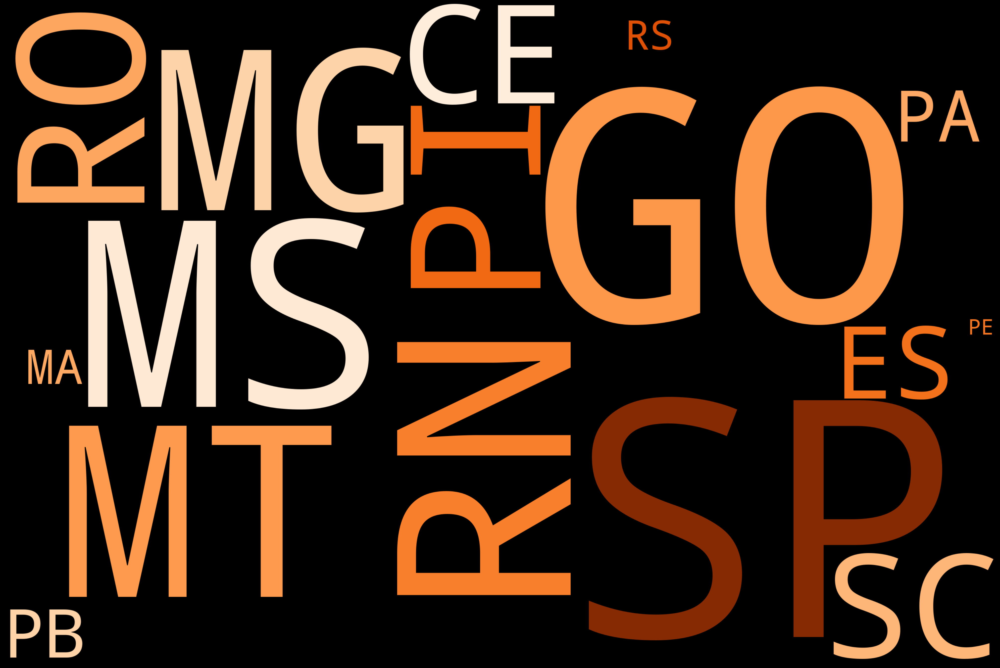

In [31]:
wordcloud_estado = WordCloud(background_color="black",collocations=False,
                              colormap="Oranges_r",
                              width = 3000,
                              height = 2000,
                              max_font_size=1000,
                              max_words=40
                             ).generate(string_estado)
plt.figure(figsize = (40,30),
           facecolor = 'k',
           edgecolor = 'k')
plt.imshow(wordcloud_estado, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

### Histograma

In [83]:
df_estado_hist = df_estado['estado'].value_counts().sort_values(ascending=False).reset_index()
df_estado_hist

,estado,count
0,SP,8127
1,GO,7764
2,MS,4723
3,RN,4073
4,MT,3972
5,MG,3460
6,PI,2153
7,RO,2057
8,SC,1955
9,CE,1766


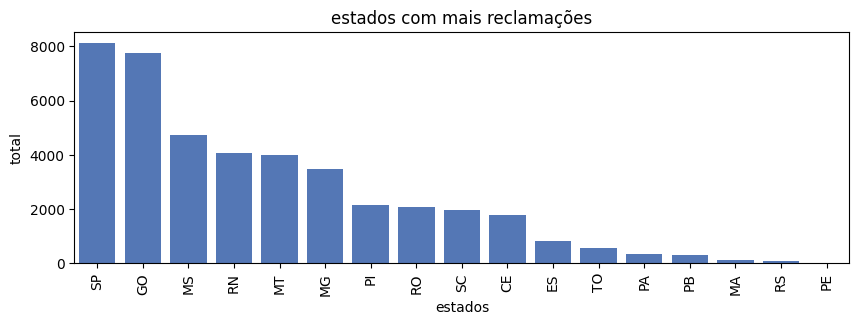

In [89]:
ax = sns.barplot(data=df_estado_hist, x='estado', y='count', color='#4473C5')
ax.figure.set_size_inches(10,3)
ax.set_title('estados com mais reclamações')
ax.set(xlabel='estados', ylabel='total')
plt.xticks(rotation=90);

SP é o Estado com mais reclamações, seguido de perto por Goiás. O restante dos Estados não chega perto do número de reclamações dos dois primeiros

## Serviços

### Criação e tratamento do dataframe de serviços

In [32]:
df_servico = df[['serviço']]

In [33]:
df_servico

,serviço
0,Outros Contratos
1,Telefonia Fixa ( Plano de Expansão / Compra e ...
2,Energia Elétrica
3,"Estacionamento ( Particular, Supermercado, Sho..."
4,Telefonia Fixa ( Plano de Expansão / Compra e ...
...,...
42302,Microcomputador / Produtos de Informática
42303,Vestuário ( Calçado / Roupa )
42304,"Acessório Para Vestuário ( Bolsa, Cinto, Chapé..."
42305,Agências e Operadoras de viagens (pacotes turí...


Substituição de caracteres especiais e espaços
"/" por ""
"," por ""
"(" por ""
")" por ""
"-" por ""
"." por ""
"\t" por "" (tab)

nesse caso não substituiremos os espaços, pois fazem parte da frase e ao substituir por _ tornará a frase única. Ao não realizarmos essa mudança, daremos peso às palavras e não às frases

In [34]:
dicionario_sem_espaco = {'/':'',',':'','\(':'','\)':'',"-":'','\.':'',r"^\t":''}

<>:1: SyntaxWarning: invalid escape sequence '\('
<>:1: SyntaxWarning: invalid escape sequence '\)'
<>:1: SyntaxWarning: invalid escape sequence '\.'
<>:1: SyntaxWarning: invalid escape sequence '\('
<>:1: SyntaxWarning: invalid escape sequence '\)'
<>:1: SyntaxWarning: invalid escape sequence '\.'
C:\Users\054181631\AppData\Local\Temp\ipykernel_38736\3733786103.py:1: SyntaxWarning: invalid escape sequence '\('
  dicionario_sem_espaco = {'/':'',',':'','\(':'','\)':'',"-":'','\.':'',r"^\t":''}
C:\Users\054181631\AppData\Local\Temp\ipykernel_38736\3733786103.py:1: SyntaxWarning: invalid escape sequence '\)'
  dicionario_sem_espaco = {'/':'',',':'','\(':'','\)':'',"-":'','\.':'',r"^\t":''}
C:\Users\054181631\AppData\Local\Temp\ipykernel_38736\3733786103.py:1: SyntaxWarning: invalid escape sequence '\.'
  dicionario_sem_espaco = {'/':'',',':'','\(':'','\)':'',"-":'','\.':'',r"^\t":''}


In [35]:
df_servico["serviço com tratamento"] = df_servico.replace({'serviço': dicionario_sem_espaco},regex=True)

C:\Users\054181631\AppData\Local\Temp\ipykernel_38736\2942101145.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_servico["serviço com tratamento"] = df_servico.replace({'serviço': dicionario_sem_espaco},regex=True)


In [36]:
df_servico["serviço com tratamento"] = df_servico["serviço com tratamento"].str.lower()

C:\Users\054181631\AppData\Local\Temp\ipykernel_38736\2645990243.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_servico["serviço com tratamento"] = df_servico["serviço com tratamento"].str.lower()


### Wordcloud

In [37]:
string_serviços = " ".join([text for text in df_servico["serviço com tratamento"]])
#criação de uma única string com os serviços

In [38]:
import unidecode
string_serviços_novo = unidecode.unidecode(string_serviços)
#removendo pontuação nas palavras para evitar que frases com pontuação correta e frases com pontuação incorreta sejam contabilizadas de forma distinta

In [39]:
from nltk.corpus import stopwords
 
nltk.download('stopwords')
stopwords = stopwords.words('portuguese')
newStopWords = ['etc','outro','outra','outros','outras','1o','2o','pre']
stopwords.extend(newStopWords)

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\054181631\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


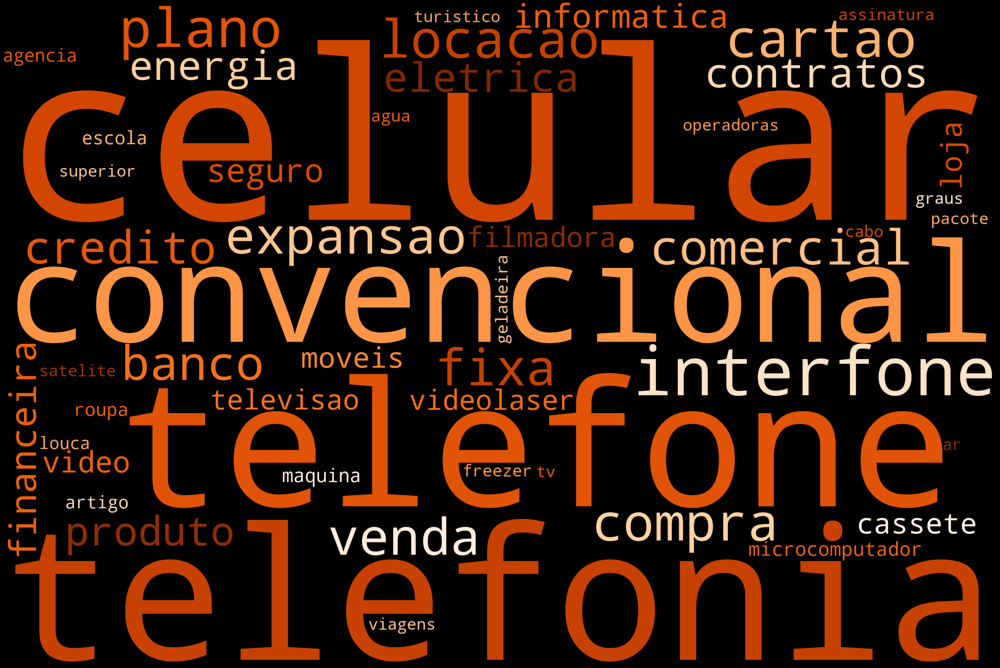

In [40]:
wordcloud_serviços = WordCloud(background_color="black",collocations=False,
                              stopwords = stopwords,
                              colormap="Oranges_r",
                              width = 3000,
                              height = 2000,
                              max_font_size=1000,
                              max_words=50
                             ).generate(string_serviços_novo)
plt.figure(figsize = (40,30),
           facecolor = 'k',
           edgecolor = 'k')
plt.imshow(wordcloud_serviços, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

os resultados acima estão em linha com o que vimos na wordlcoud das empresas. Palavras ligadas a telefonia e internet dominando a maioria das menções

### Histograma

In [41]:
#nltk.download()
from nltk.tokenize import word_tokenize

In [42]:
palavras = word_tokenize(string_serviços_novo)
palavras_filtrada = []

for w in palavras:
    if w not in stopwords:
        palavras_filtrada.append(w)

#tokenização de palavras e criação de uma lista para colocar todas as palavras que não estão dentro das stopwords. Para realizar o histograma esse método se mostrou mais eficiente

In [43]:
from collections import Counter
count = dict(Counter(word for sentence in palavras_filtrada for word in sentence.split()))
count
#contagem de todas as palavras

In [45]:
df_servico_hist = pd.DataFrame.from_dict(count, orient='index')
df_servico_hist
#criação de um dataframe a partir do dicionário de palavras anterior

,0
contratos,1860
telefonia,5772
fixa,2713
plano,3101
expansao,2713
...,...
embaladas,1
atmosfera,1
modificada,1
sistema,1


In [47]:
df_servico_hist.reset_index(inplace=True)
df_servico_hist
#retirando as palavras do index e botando como informação de uma coluna do dataframe

,index,0
0,contratos,1860
1,telefonia,5772
2,fixa,2713
3,plano,3101
4,expansao,2713
...,...,...
653,embaladas,1
654,atmosfera,1
655,modificada,1
656,sistema,1


In [49]:
df_servico_hist.columns
#verificando o nome de cada coluna do dataframe

Index(['index', 0], dtype='object')

In [50]:
df_servico_hist.rename(columns = {'index':'serviços', 0:'count'}, inplace=True)
df_servico_hist
#substituição dos nomes das colunas

,serviços,count
0,contratos,1860
1,telefonia,5772
2,fixa,2713
3,plano,3101
4,expansao,2713
...,...,...
653,embaladas,1
654,atmosfera,1
655,modificada,1
656,sistema,1


In [51]:
df_servico_hist.sort_values('count', ascending=False, inplace=True)
#ordenando a base dos serviços mais mencionados até os menores

In [90]:
df_servico_hist = df_servico_hist.head(50).reset_index()
df_servico_hist
#selecionando apenas os 50 serviços mais mencionados

,index,serviços,count
0,35,celular,8186
1,1,telefonia,5772
2,33,telefone,5149
3,36,interfone,5149
4,34,convencional,5149
5,3,plano,3101
6,37,cartao,2992
7,7,locacao,2951
8,5,compra,2856
9,6,venda,2761


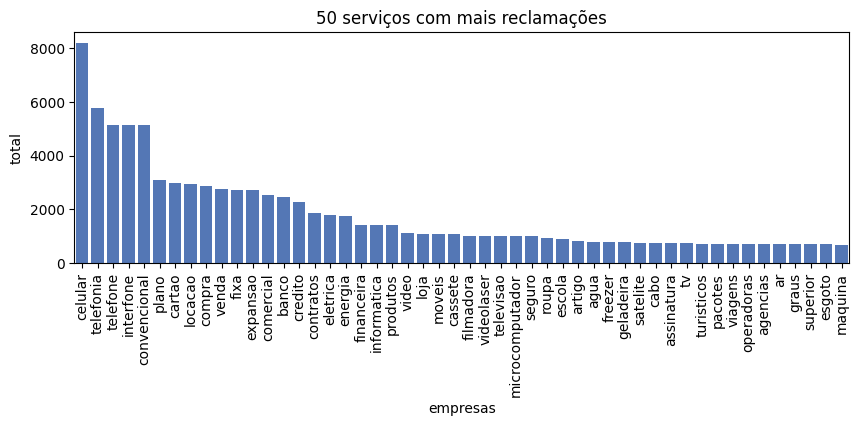

In [53]:
ax = sns.barplot(data=df_servico_hist, x='serviços', y='count', color='#4473C5')
ax.figure.set_size_inches(10,3)
ax.set_title('50 serviços com mais reclamações')
ax.set(xlabel='empresas', ylabel='total')
plt.xticks(rotation=90);

o gráfico acima permite uma visualização e comparação melhor entre os serviços com mais reclamações

### Wordcloud de bigrama

In [54]:
from nltk import ngrams

In [55]:
def testFuncNew(text):
        text = ' '.join([word for word in text.split() if word not in stopwords])
        return text
#função para transformar o texto retirando as stopwords

In [56]:
string_stop = testFuncNew(string_serviços_novo)
string_stop
#retirando as stopwords da string de serviços novo, onde tinham sido retiradas as pontuações e caracteres especiais

'contratos telefonia fixa plano expansao compra venda locacao energia eletrica estacionamento particular supermercado shopping telefonia fixa plano expansao compra venda locacao agencias operadoras viagens pacotes turisticos artigos enxoval cama mesa banho telefonia fixa plano expansao compra venda locacao academia ginastica natacao esportes oficinas mecanica funilaria autoeletrica borracharia telefone convencional celular interfone cartao credito financeira moveis quarto seguro vida financeira seguro energia eletrica seguros financeira banco comercial energia eletrica moveis cozinha automovel locacao assistencia automobilistica clube automovel auto escola plano saude regulamentado banco comercial telefonia celular consultoria assessoria agenciamento recolocacao profissional agencia empregada casamento telefone convencional celular interfone moveis quarto moveis sala telefonia celular curso linguas energia eletrica loteamento energia eletrica financeira energia eletrica colchao energia

não foi realizado o mesmo método de antes com a adição em lista, uma vez que para realizar o método abaixo de bigrama a lista não funciona, por isso foi criada a função

In [57]:
pares = list(nltk.bigrams(string_stop.split()))
#separando em bigramas a frase acima

In [58]:
count_pares = dict(Counter(pares))
count_pares
#transformando a lista de bigrama acima em dicionário para contar o total de combinações e depois realizar a wordcloud

{('contratos', 'telefonia'): 196,
 ('telefonia', 'fixa'): 2713,
 ('fixa', 'plano'): 2713,
 ('plano', 'expansao'): 2713,
 ('expansao', 'compra'): 2713,
 ('compra', 'venda'): 2713,
 ('venda', 'locacao'): 2713,
 ('locacao', 'energia'): 182,
 ('energia', 'eletrica'): 1747,
 ('eletrica', 'estacionamento'): 5,
 ('estacionamento', 'particular'): 40,
 ('particular', 'supermercado'): 40,
 ('supermercado', 'shopping'): 40,
 ('shopping', 'telefonia'): 7,
 ('locacao', 'agencias'): 62,
 ('agencias', 'operadoras'): 720,
 ('operadoras', 'viagens'): 720,
 ('viagens', 'pacotes'): 720,
 ('pacotes', 'turisticos'): 720,
 ('turisticos', 'artigos'): 2,
 ('artigos', 'enxoval'): 60,
 ('enxoval', 'cama'): 60,
 ('cama', 'mesa'): 60,
 ('mesa', 'banho'): 60,
 ('banho', 'telefonia'): 7,
 ('locacao', 'academia'): 8,
 ('academia', 'ginastica'): 80,
 ('ginastica', 'natacao'): 80,
 ('natacao', 'esportes'): 80,
 ('esportes', 'oficinas'): 1,
 ('oficinas', 'mecanica'): 99,
 ('mecanica', 'funilaria'): 99,
 ('funilaria', '

In [59]:
pares_string = {",".join(key): value for key, value in count_pares.items()}
pares_string
#é preciso transformar em dict do tipo string para que  wordcloud funcione, caso contrário ela dará erro

{'contratos,telefonia': 196,
 'telefonia,fixa': 2713,
 'fixa,plano': 2713,
 'plano,expansao': 2713,
 'expansao,compra': 2713,
 'compra,venda': 2713,
 'venda,locacao': 2713,
 'locacao,energia': 182,
 'energia,eletrica': 1747,
 'eletrica,estacionamento': 5,
 'estacionamento,particular': 40,
 'particular,supermercado': 40,
 'supermercado,shopping': 40,
 'shopping,telefonia': 7,
 'locacao,agencias': 62,
 'agencias,operadoras': 720,
 'operadoras,viagens': 720,
 'viagens,pacotes': 720,
 'pacotes,turisticos': 720,
 'turisticos,artigos': 2,
 'artigos,enxoval': 60,
 'enxoval,cama': 60,
 'cama,mesa': 60,
 'mesa,banho': 60,
 'banho,telefonia': 7,
 'locacao,academia': 8,
 'academia,ginastica': 80,
 'ginastica,natacao': 80,
 'natacao,esportes': 80,
 'esportes,oficinas': 1,
 'oficinas,mecanica': 99,
 'mecanica,funilaria': 99,
 'funilaria,autoeletrica': 99,
 'autoeletrica,borracharia': 99,
 'borracharia,telefone': 13,
 'telefone,convencional': 5149,
 'convencional,celular': 5149,
 'celular,interfone'

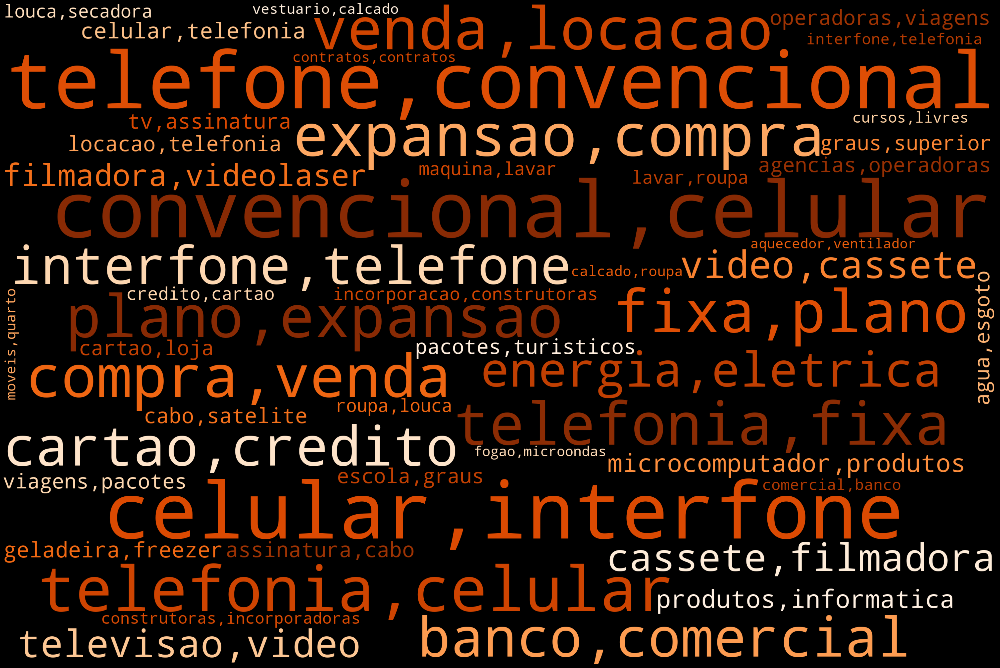

In [60]:
wordcloud_serviços_pares = WordCloud(background_color="black",collocations=False,
                              stopwords = stopwords,
                              colormap="Oranges_r",
                              width = 3000,
                              height = 2000,
                              max_font_size=1000,
                              max_words=50
                             ).generate_from_frequencies(pares_string)
plt.figure(figsize = (40,30),
           facecolor = 'k',
           edgecolor = 'k')
plt.imshow(wordcloud_serviços_pares, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

a wordcloud funciona, mas fica com as palavras divididas por "," devido a formatação de quando a tokenização foi transformada em lista. Os próximos passos vão tentar tornar a leitura mais fluida substituindo o "," por _

### Histograma de bigrama e formatação dos nomes de serviços

In [61]:
df_servico_bi = pd.DataFrame.from_dict(count_pares, orient='index')
df_servico_bi
#transformação do dicionário de pares em dataframe

,0
"(contratos, telefonia)",196
"(telefonia, fixa)",2713
"(fixa, plano)",2713
"(plano, expansao)",2713
"(expansao, compra)",2713
...,...
"(marcenaria, incorporacao)",1
"(oculos, cartao)",1
"(prazo, empresa)",1
"(cargas, plano)",1


In [62]:
df_servico_bi = pd.DataFrame.from_dict(pares_string, orient='index')
df_servico_bi2 = df_servico_bi.reset_index()
df_servico_bi2['index'] = df_servico_bi2['index'].str.replace(",", "_")
df_servico_bi2
#transformação do index das palavras em index número e sequencial para poder substituir a "," por "_"

,index,0
0,contratos_telefonia,196
1,telefonia_fixa,2713
2,fixa_plano,2713
3,plano_expansao,2713
4,expansao_compra,2713
...,...,...
5680,marcenaria_incorporacao,1
5681,oculos_cartao,1
5682,prazo_empresa,1
5683,cargas_plano,1


In [63]:
df_servico_bi2.rename(columns = {'index':'serviços', 0:'count'}, inplace=True)
#renomeando as colunas

In [64]:
df_servico_bi2.sort_values('count', ascending=False, inplace=True)
df_servico_bi2 = df_servico_bi2.head(50)
df_servico_bi2
#ordenamento dos serviços por frequência que as palavras aparecem pegando os 50 mais comuns

,serviços,count
35,telefone_convencional,5149
36,convencional_celular,5149
37,celular_interfone,5149
68,telefonia_celular,3037
2,fixa_plano,2713
3,plano_expansao,2713
4,expansao_compra,2713
5,compra_venda,2713
6,venda_locacao,2713
1,telefonia_fixa,2713


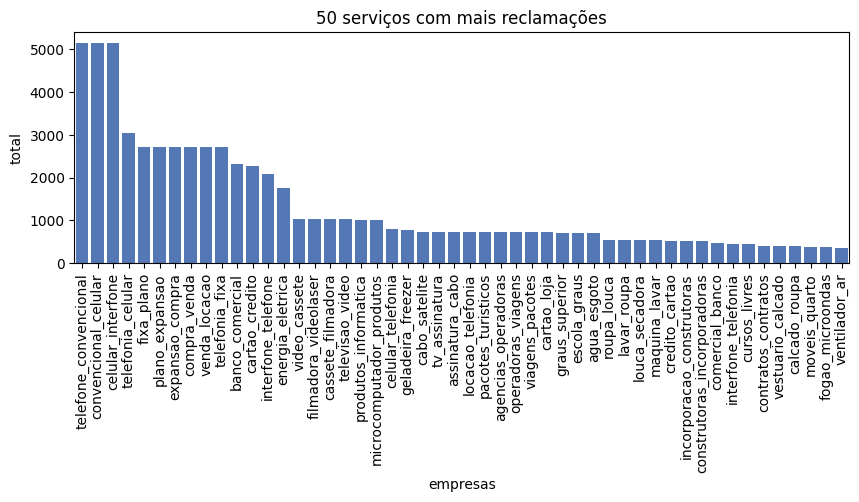

In [65]:
ax = sns.barplot(data=df_servico_bi2, x='serviços', y='count', color='#4473C5')
ax.figure.set_size_inches(10,3)
ax.set_title('50 serviços com mais reclamações')
ax.set(xlabel='empresas', ylabel='total')
plt.xticks(rotation=90);

histograma acima ajuda a visualizar os serviços com mais problemas dentro de um bigrama, o que permite entende a ligação entre duas palavras. Ao invés de termos apenas telefonia, temos a especificação de qual tipo de telefonia apresenta problema e assim por diante

### Wordcloud de bigrama

o wordcloud de bigrama foi mais complexo, pois como houve a transformação para dataframe, a reversão foi mais complicada. Contudo, foi o método encontrado para ajustar melhor as palavras e torná-las mais legíveis do que só tendo uma vírgula entre palavras

In [66]:
df_servico_bi = df_servico_bi2.set_index('serviços')
df_servico_bi = df_servico_bi.rename_axis(None)
df_servico_bi
#reversão para o index original de palavras

,count
telefone_convencional,5149
convencional_celular,5149
celular_interfone,5149
telefonia_celular,3037
fixa_plano,2713
plano_expansao,2713
expansao_compra,2713
compra_venda,2713
venda_locacao,2713
telefonia_fixa,2713


In [67]:
series_dict = df_servico_bi.to_dict('series')
series_dict
#transformação do dataframe em dicionário

{'count': telefone_convencional          5149
 convencional_celular           5149
 celular_interfone              5149
 telefonia_celular              3037
 fixa_plano                     2713
 plano_expansao                 2713
 expansao_compra                2713
 compra_venda                   2713
 venda_locacao                  2713
 telefonia_fixa                 2713
 banco_comercial                2313
 cartao_credito                 2274
 interfone_telefone             2075
 energia_eletrica               1747
 video_cassete                  1031
 filmadora_videolaser           1031
 cassete_filmadora              1031
 televisao_video                1031
 produtos_informatica           1018
 microcomputador_produtos       1018
 celular_telefonia               787
 geladeira_freezer               773
 cabo_satelite                   736
 tv_assinatura                   736
 assinatura_cabo                 736
 locacao_telefonia               733
 pacotes_turisticos          

In [68]:
series_dict = series_dict.pop('count')
series_dict
#retirando o count do dicionário para voltar ao formato original de serviço : contagem total

telefone_convencional          5149
convencional_celular           5149
celular_interfone              5149
telefonia_celular              3037
fixa_plano                     2713
plano_expansao                 2713
expansao_compra                2713
compra_venda                   2713
venda_locacao                  2713
telefonia_fixa                 2713
banco_comercial                2313
cartao_credito                 2274
interfone_telefone             2075
energia_eletrica               1747
video_cassete                  1031
filmadora_videolaser           1031
cassete_filmadora              1031
televisao_video                1031
produtos_informatica           1018
microcomputador_produtos       1018
celular_telefonia               787
geladeira_freezer               773
cabo_satelite                   736
tv_assinatura                   736
assinatura_cabo                 736
locacao_telefonia               733
pacotes_turisticos              720
agencias_operadoras         

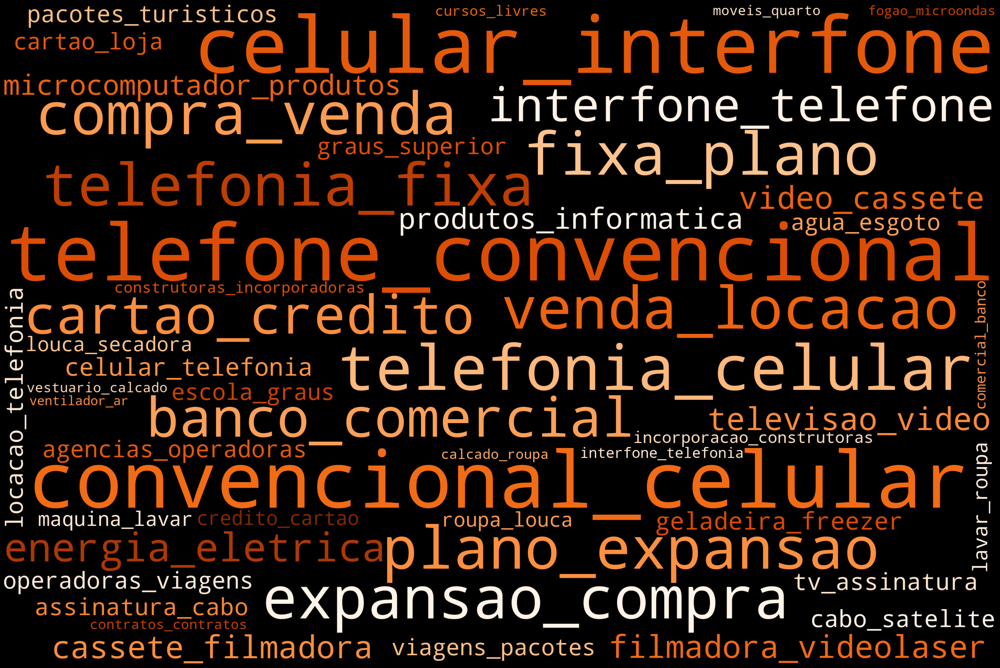

In [69]:
wordcloud_serviços_pares = WordCloud(background_color="black",collocations=False,
                              stopwords = stopwords,
                              colormap="Oranges_r",
                              width = 3000,
                              height = 2000,
                              max_font_size=1000,
                              max_words=50
                             ).generate_from_frequencies(series_dict)
plt.figure(figsize = (40,30),
           facecolor = 'k',
           edgecolor = 'k')
plt.imshow(wordcloud_serviços_pares, interpolation='bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

com os resultados acima, temos mais exatidão sobre os tipos de problema, por exemplo os problemas de telefonia tem a distinção entre telefonia fixa ou celular. Para uma análise mais aprofundada, o ideal seria separar de tal forma que a ordem das palavras não afetasse a wordcloud e sim a presença delas

## Idade

### Criação e tratamento do dataframe de idade

In [278]:
df_idade = df[['faixa etarea']]
df_idade
#criação de um dataframe com base na coluna do dataframe original de faixa etárea

,faixa etarea
0,entre 31 a 40 anos
1,mais de 70 anos
2,entre 31 a 40 anos
3,entre 31 a 40 anos
4,entre 41 a 50 anos
...,...
42302,Nao Informada
42303,entre 31 a 40 anos
42304,entre 21 a 30 anos
42305,Nao Informada


In [279]:
df_idade.shape
#formato do dataframe

(42307, 1)

In [280]:
print(df_idade.isna().sum())
(df_idade == 'Nao Informada').sum()
#quantidade de linhas sem informação. Por estarem preenchidas como não informada, o método de isna/isnull não encontra as informações faltantes, pois a informação de não ter informação conta como uma

faixa etarea    0
dtype: int64


faixa etarea    3501
dtype: int64

In [281]:
df_idade = df_idade[df_idade['faixa etarea'] != 'Nao Informada']
#retirando todas as linhas com idade não informada

In [282]:
df_idade.value_counts()

faixa etarea      
entre 31 a 40 anos    9372
entre 41 a 50 anos    7820
entre 21 a 30 anos    7089
entre 51 a 60 anos    6559
entre 61 a 70 anos    4792
mais de 70 anos       2251
até 20 anos            923
Name: count, dtype: int64

In [283]:
df_idade.columns

Index(['faixa etarea'], dtype='object')

In [284]:
conditions = [
    df_idade['faixa etarea'] == 'até 20 anos',
    df_idade['faixa etarea'] == 'entre 21 a 30 anos',
    df_idade['faixa etarea'] == 'entre 31 a 40 anos',
    df_idade['faixa etarea'] == 'entre 41 a 50 anos',
    df_idade['faixa etarea'] == 'entre 51 a 60 anos',
    df_idade['faixa etarea'] == 'entre 61 a 70 anos',
    df_idade['faixa etarea'] == 'mais de 70 anos',
]

categories = ['20- anos', '21-30 anos', '31-40 anos','41-50 anos','51-60 anos','61-70 anos','70+ anos']

df_idade['idade'] = np.select(conditions, categories, default='Unknown')
#criação de uma nova coluna no dataframe com base na coluna de faixa etárea


In [286]:
df_idade

,faixa etarea,idade
0,entre 31 a 40 anos,31-40 anos
1,mais de 70 anos,70+ anos
2,entre 31 a 40 anos,31-40 anos
3,entre 31 a 40 anos,31-40 anos
4,entre 41 a 50 anos,41-50 anos
...,...,...
42300,entre 21 a 30 anos,21-30 anos
42301,entre 31 a 40 anos,31-40 anos
42303,entre 31 a 40 anos,31-40 anos
42304,entre 21 a 30 anos,21-30 anos


In [287]:
df_idade['idade'].value_counts()
#vendo a quantidade de entradas para cada categoria

idade
31-40 anos    9372
41-50 anos    7820
21-30 anos    7089
51-60 anos    6559
61-70 anos    4792
70+ anos      2251
20- anos       923
Name: count, dtype: int64

### Histograma

In [291]:
df_idade['idade'] = pd.Categorical(df_idade['idade'], ['20- anos','21-30 anos','31-40 anos','41-50 anos','51-60 anos','61-70 anos','70+ anos'])
#definindo a ordem as variáveis para posteriormente o gráfico seguir a mesma ordem

C:\Users\054181631\AppData\Local\Temp\ipykernel_38736\2175313212.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_idade['idade'] = pd.Categorical(df_idade['idade'], ['20- anos','21-30 anos','31-40 anos','41-50 anos','51-60 anos','61-70 anos','70+ anos'])


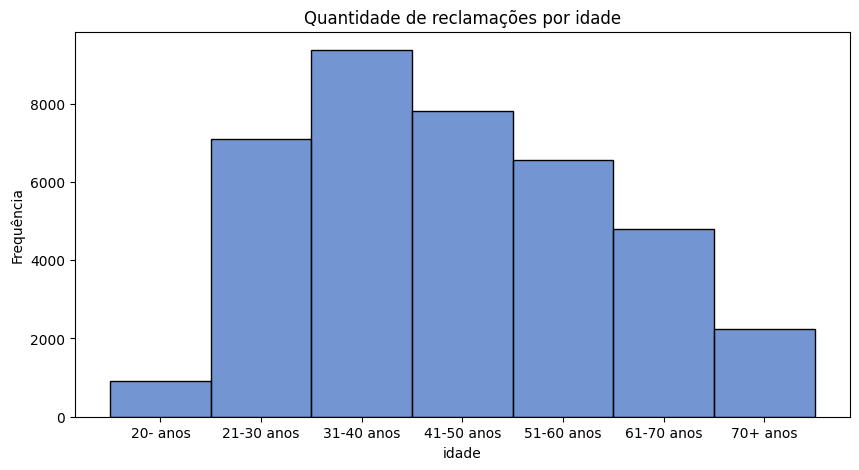

In [292]:
plt.figure(figsize=(10, 5))
sns.histplot(data=df_idade, 
             x='idade', 
             color='#4473C5',
             )
plt.title('Quantidade de reclamações por idade')
plt.xlabel('idade')
plt.ylabel('Frequência')
plt.show()
#gráfico de histograma é mais adequado para esse caso onde não temos uma coluna de contagem. O histograma é melhor para calcular a frequência

reclamações de 21-30 anos e de 41-60 anos são relativamente parecidas.

as exceções são as reclamações entre 31-40 anos, substancialmente maiores que as demais e nas demais idades são susbtancialmente menores, especialmente nos 20 anos ou menos, que pode ser explicado por ser uma idade de menor poder aquisitivo e responsabilidades e portanto menores reclamações de produtos e serviços